### **Sentiment Analysis - Hotel Reviews**

Sentiment analysis is part of the Natural Language Processing (NLP) techniques that consists in extracting emotions related to some raw texts. This is usually used on social media posts and customer reviews in order to automatically understand if some users are positive or negative and why. The goal of this study is to analyse the sentiment of the customers who visited & stayed at the hostel across Europe.
 
Below are the libraries used in the notebook.
 
- NLTK: the most famous python module for NLP techniques
- googletrans: used to translate customer reviews from different languages to English.
- Gensim: a topic-modelling and vector space modelling toolkit
- Scikit-learn: the most used python machine learning library
 
We have used sample hotel reviews data. Each observation consists in one customer review for one hotel. Each customer review is composed of a textual feedback of the customer's experience at the hotel and an overall rating.
 
For each textual review, we want to predict if it corresponds to a good review (the customer is happy) or to a bad one (the customer is not satisfied). The reviews overall ratings can range from 2.5/10 to 10/10. In order to simplify the problem we will split those into two categories:
- bad reviews have overall ratings < 5
- good reviews have overall ratings >= 5
 
We have also implemented a mechanism to translate the customer reviews from different languages to English.

### **Initialize Spark Session**

In [1]:
# Loading the Raw data
from pyspark.sql import SparkSession
import pandas as pd

# Initialize Spark session
spark = SparkSession.builder \
    .appName("Hotel Reviews") \
    .getOrCreate()

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 3, Finished, Available, Finished)

### **Read Delta table**

Read the delta table "Hotel Review" from Delta table from LakeHouse and converting it to Panda's Data Frame.

In [2]:
# Read data from the Delta table
delta_table_path = "abfss://377d6253-22a1-4a71-9e02-ce043c0187d0@onelake.dfs.fabric.microsoft.com/5128015b-75b7-4dc6-9e82-05705a301a66/Tables/hotelreviews"
reviews_df_spark = spark.read.format("delta").load(delta_table_path)
# Convert the Spark DataFrame to a Pandas DataFrame
reviews_df = reviews_df_spark.toPandas()

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 4, Finished, Available, Finished)

### **Adding ID column**

Adding ID to get the Unique Identifier

In [3]:
reviews_df['ID'] = range(1, len(reviews_df) + 1)
reviews_df = reviews_df[['ID'] + [col for col in reviews_df.columns if col != 'ID']]
# Display the DataFrame with the new ID column
display(reviews_df)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 5, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, c9ec251d-5408-4517-a58c-16422677305d)


We first start by loading the raw data. Each textual reviews is splitted into a positive part and a negative part. We group them together in order to start with only raw text data and no other information.

In [4]:
reviews_df["review"] = reviews_df["Negative_Review"] + reviews_df["Positive_Review"]
display(reviews_df)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 6, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, aa1edeb4-5b7a-488e-b947-b6c2b65ffe0f)

### **Remove 'No Negative' or 'No Positive' from text**

If the user doesn't leave any negative feedback comment, this will appear as "No Negative" in our data. This is the same for the positive comments with the default value "No Positive". We have to remove those parts from our texts.


In [5]:
reviews_df["review"] = reviews_df["review"].apply(lambda x: x.replace("No Negative", "").replace("No Positive", ""))
display(reviews_df)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 7, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 72e2a63a-7699-4aad-ae3d-88e52809b33e)

### **Translation**

Installing googletrans package to translate the reviews from different languages to English

In [6]:
pip install googletrans==3.1.0a0


StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 8, Finished, Available, Finished)

  Preparing metadata (setup.py) ... - \ done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 17.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 27.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 46.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 22.4 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16352 sha256=e2a8b01554e5abaa55b1d08927a5e2336660d2451eb99b4933a8f88227708cd1
  Stored in directory: /home/trusted-service-user/.cache/pip/wheels/81/f2/e0/d578821d723b473d18610ea93810e4a5402463919f07e603d9
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 4.0.

In [7]:
from googletrans import Translator
import pandas as pd

# Initialize the Translator
translator = Translator()

# Function to translate text to English
def translate_text(text):     
    if text:
        try:
            translated = translator.translate(text, dest='en')
            return translated.text
        except Exception as e:
            return "Translation Error"
    return None

# Specify the columns to translate
columns_to_translate = ['review']  

# Apply translation to each specified column
for col in columns_to_translate:
    if col in reviews_df.columns:
        reviews_df[f"{col}_english"] = reviews_df[col].apply(translate_text)

# Display the DataFrame with translated columns
display(reviews_df)



StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 9, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 611dfa98-2aac-48a6-88f2-2cbe0f133515)

### **Sample Data**

Taking sample data for Analysis


In [8]:
reviews_df = reviews_df.sample(frac = 0.2, replace = False, random_state=42)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 10, Finished, Available, Finished)

### **Clean Data**

To clean textual data, we call our custom 'clean_text' function that performs several transformations:

- lower the text
- tokenize the text (split the text into words) and remove the punctuation
- remove useless words that contain numbers
- remove useless stop words like 'the', 'a' ,'this' etc.
- Part-Of-Speech (POS) tagging: assign a tag to every word to define if it corresponds to a noun, a verb etc. using the WordNet lexical database
- lemmatize the text: transform every word into their root form (e.g. rooms -> room, slept -> sleep)

In [9]:
import nltk
import string
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk import pos_tag, WordNetLemmatizer

# Ensure necessary NLTK data is downloaded
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

# Function to get wordnet POS tags
def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return 'a'  # Adjective
    elif treebank_tag.startswith('V'):
        return 'v'  # Verb
    elif treebank_tag.startswith('N'):
        return 'n'  # Noun
    elif treebank_tag.startswith('R'):
        return 'r'  # Adverb
    else:
        return 'n'  # Default to noun

# Clean text function
def clean_text(text):
    if not text:
        return ""
    text = text.lower()
    text = [word.strip(string.punctuation) for word in text.split(" ")]
    text = [word for word in text if not any(c.isdigit() for c in word)]
    stop = stopwords.words('english')
    text = [x for x in text if x not in stop]
    text = [t for t in text if len(t) > 0]
    pos_tags = pos_tag(text)
    text = [WordNetLemmatizer().lemmatize(t[0], get_wordnet_pos(t[1])) for t in pos_tags]
    text = [t for t in text if len(t) > 1]
    return " ".join(text)



StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 11, Finished, Available, Finished)

[nltk_data] Downloading package stopwords to /home/trusted-service-
[nltk_data]     user/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /home/trusted-service-
[nltk_data]     user/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/trusted-service-user/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /home/trusted-service-
[nltk_data]     user/nltk_data...


In [10]:
# Apply the cleaning function to the appropriate column
reviews_df["review_clean"] = reviews_df["review_english"].apply(lambda x: clean_text(x))
display(reviews_df)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 12, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 60c6631d-75c8-4bf1-a729-384320fb7600)

In [11]:
# Create the label for bad reviews
reviews_df["is_bad_review"] = reviews_df["Reviewer_Score"].apply(lambda x: 1 if x < 5 else 0)
display(reviews_df)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 13, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, f207bedb-50a2-48ed-9012-d28d68ec5ee2)

In [14]:
from pyspark.sql import SparkSession

# Assuming Spark session is initialized and reviews_df is a pandas DataFrame
final_reviews_df = spark.createDataFrame(reviews_df)

# Write the DataFrame as a Delta table
# Ensure your notebook is attached to a Lakehouse in Fabric
final_reviews_df.write.format("delta").mode("overwrite").save("abfss://377d6253-22a1-4a71-9e02-ce043c0187d0@onelake.dfs.fabric.microsoft.com/5128015b-75b7-4dc6-9e82-05705a301a66/Tables/PowerBISource_2")



StatementMeta(, 9eb1c0e6-df7a-426a-b896-2d625f6d2ed8, 16, Finished, Available, Finished)

### **Feature Engineering**

We first start by adding sentiment analysis features because we can guess that customers reviews are highly linked to how they felt about their stay at the hotel. We use Vader, which is a part of the NLTK module designed for sentiment analysis. Vader uses a lexicon of words to find which ones are positives or negatives. It also takes into accout the context of the sentences to determine the sentiment scores. For each text, Vader retuns 4 values:

- a neutrality score
- a positivity score
- a negativity score
- an overall score that summarizes the previous scores



In [12]:
import pandas as pd
import numpy as np
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk

# Download VADER lexicon if not already done
nltk.download('vader_lexicon')

# Initialize the VADER Sentiment Analyzer
sid = SentimentIntensityAnalyzer()


# Check if the 'review' column exists and handle NaN values
if 'review_english' in reviews_df.columns:
    # Fill NaN values with an empty string to prevent errors
    reviews_df["review_english"] = reviews_df["review_english"].fillna("")
    
    # Apply VADER sentiment analysis
    reviews_df["sentiments"] = reviews_df["review_english"].apply(lambda x: sid.polarity_scores(x))
    
    # Expand the sentiments into separate columns
    reviews_df = pd.concat([reviews_df.drop(['sentiments'], axis=1), reviews_df['sentiments'].apply(pd.Series)], axis=1)
else:
    print("The specified column 'review' does not exist in the DataFrame.")


display(reviews_df)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 14, Finished, Available, Finished)

[nltk_data] Downloading package vader_lexicon to /home/trusted-
[nltk_data]     service-user/nltk_data...


SynapseWidget(Synapse.DataFrame, e9ca623e-5037-4d91-b385-76f6d43ee60e)

We will integrate those 4 values as features in our dataset.

Next, we add some simple metrics for every text:
- number of characters in the text
- number of words in the text


In [13]:
# add number of characters column
reviews_df["nb_chars"] = reviews_df["review_english"].apply(lambda x: len(x))

# add number of words column
reviews_df["nb_words"] = reviews_df["review_english"].apply(lambda x: len(x.split(" ")))

display(reviews_df)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 15, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 200d90a7-3eae-4cb0-a0c0-ef5f3ae3f329)

### **Extracting Vector Representations**

The next step consist in extracting vector representations for every review. The module Gensim creates a numerical vector representation of every word in the corpus by using the contexts in which they appear (Word2Vec). This is performed using shallow neural networks. What's interesting is that similar words will have similar representation vectors.

Each text can also be transformed into numerical vectors using the word vectors (Doc2Vec). Same texts will also have similar representations and that is why we can use those vectors as training features.

We first have to train a Doc2Vec model by feeding in our text data. By applying this model on our reviews, we can get those representation vectors.

In [14]:
!pip install gensim

import pandas as pd
from gensim.models.doc2vec import Doc2Vec, TaggedDocument


# Ensure 'review_clean' column exists
if 'review_clean' in reviews_df.columns:
    # Create tagged documents
    documents = [TaggedDocument(doc.split(" "), [i]) for i, doc in enumerate(reviews_df["review_clean"])]
    
    # Train a Doc2Vec model with our text data
    model = Doc2Vec(documents, vector_size=5, window=2, min_count=1, workers=4)
    
    # Transform each document into a vector
    doc2vec_df = reviews_df["review_clean"].apply(lambda x: model.infer_vector(x.split(" "))).apply(pd.Series)
    
    # Rename columns
    doc2vec_df.columns = ["doc2vec_vector_" + str(x) for x in doc2vec_df.columns]
    
    # Concatenate the new vectors with the original DataFrame
    reviews_df = pd.concat([reviews_df, doc2vec_df], axis=1)
else:
    print("The specified column 'review_clean' does not exist in the DataFrame.")
display(reviews_df)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 16, Finished, Available, Finished)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.7/26.7 MB 96.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.4/61.4 kB 24.4 MB/s eta 0:00:00


/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/paramiko/transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


SynapseWidget(Synapse.DataFrame, 5bcaf521-e38c-4f91-a605-a5acb4084b3a)

Getting the shape of the data frame before we adding TF-IDF

In [15]:
reviews_df.shape

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 17, Finished, Available, Finished)

(255, 33)

### **Add the TF-IDF (Term Frequency - Inverse Document Frequency) values for every word and every document.**

But why not simply counting how many times each word appears in every document? The problem with this method is that it doesn't take into account the relative importance of words in the texts. A word that appears in almost every text would not likely bring useful information for analysis. On the contrary, rare words may have a lot more of meanings.

The TF-IDF metric solves this problem:

TF computes the classic number of times the word appears in the text
IDF computes the relative importance of this word which depends on how many texts the word can be found
We add TF-IDF columns for every word that appear in at least 10 different texts to filter some of them and reduce the size of the final output.

In [16]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer

# Ensure 'review_clean' column exists
if 'review_clean' in reviews_df.columns:
    # Initialize TF-IDF Vectorizer
    tfidf = TfidfVectorizer(min_df=1)  # Adjust min_df as needed

    # Fit and transform the reviews into TF-IDF features
    tfidf_result = tfidf.fit_transform(reviews_df["review_clean"]).toarray()

    # Create a DataFrame from the TF-IDF results
    tfidf_df = pd.DataFrame(tfidf_result, columns=tfidf.get_feature_names_out())

    # Rename columns to avoid conflicts
    tfidf_df.columns = ["word_" + str(x) for x in tfidf_df.columns]

    # Align the index of the new DataFrame with the original DataFrame
    tfidf_df.index = reviews_df.index

    # Concatenate the new TF-IDF features with the original DataFrame
    reviews_df = pd.concat([reviews_df, tfidf_df], axis=1)
else:
    print("The specified column 'review_clean' does not exist in the DataFrame.")

# Display the updated DataFrame
display(reviews_df)


StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 18, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, b76cc231-6e80-4c00-8e6c-ad668663d278)

In [17]:
#To get number of rows & columns
reviews_df.shape

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 19, Finished, Available, Finished)

(255, 1504)

### **Exploratory data analysis** 
 
In order to have a better understanding of our data, let's explore it a little:

In [18]:
# show is_bad_review distribution
reviews_df["is_bad_review"].value_counts(normalize = True)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 20, Finished, Available, Finished)

is_bad_review
0    0.960784
1    0.039216
Name: proportion, dtype: float64

Our dataset is highly imbalanced because less than 5% of our reviews are considered as negative ones. This information will be very useful for the modelling part.

Now let's print some wordclouds to have a glimpse at what kind of words apear in our reviews:

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 21, Finished, Available, Finished)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 6.7 MB/s eta 0:00:00a 0:00:01


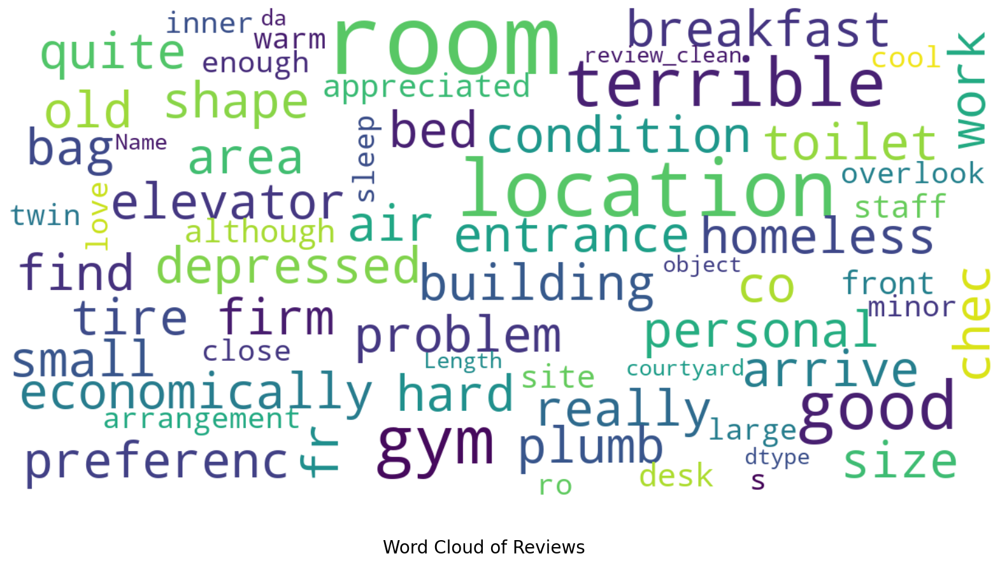

In [19]:
!pip install wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def show_wordcloud(data, title=None):
    # Generate the word cloud
    wordcloud = WordCloud(
        background_color='white',
        max_words=200,
        max_font_size=40,
        scale=3,
        random_state=42
    ).generate(str(data))

    # Set up the figure
    fig = plt.figure(1, figsize=(20, 20))
    plt.axis('off')
    if title:
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    # Display the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.show()

# Example usage: Change the column name if needed
show_wordcloud(reviews_df["review_clean"], title="Word Cloud of Reviews")


Most of the words are indeed related to the hotels: room, staff, breakfast, etc. Some words are more related to the customer experience with the hotel stay: perfect, loved, expensive, dislike, etc.

In [20]:
# highest positive sentiment reviews (with more than 5 words)
reviews_df[reviews_df["nb_words"] >= 5].sort_values("pos", ascending = False)[["review", "pos"]].head(10)


StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 22, Finished, Available, Finished)

,review,pos
170,Great location very helpful and friendly staf...,0.722
58,Fine bed Well equipped bathroom Lovely staff ...,0.702
54,great staff bed was comfortable and room was ...,0.700
231,Buffet breakfasts Beautiful room responsive s...,0.669
29,Very quiet and comfortable Lovely neighbourhood,0.648
986,Amazing food with Amazing staff Location was ...,0.643
51,Beautiful hotel great location friendly helpf...,0.607
155,Friendly staff Good breakfast Comfortable roo...,0.603
536,Window wouldn t open Friendly professional s...,0.582
1027,The facilities were amazing Great food and th...,0.572


The most positive reviews indeed correspond to some good feedbacks.

In [21]:
# lowest negative sentiment reviews (with more than 5 words)
reviews_df[reviews_df["nb_words"] >= 5].sort_values("neg", ascending = False)[["review", "neg"]].head(10)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 23, Finished, Available, Finished)

,review,neg
838,Sofa bed was awful It was really uncomfortabl...,0.465
695,No plans to stay again,0.355
254,Tiny bathroom Breakfast ok but not very elega...,0.338
700,Extremly small rooms Feels like a prison,0.337
308,No safe in room and no space to hang clothes,0.308
704,The guy at reception was polite but absolutel...,0.306
777,Breakfast is terrible air conditioning terrib...,0.305
303,this is a fake 4 stars hotel The bathroom do ...,0.303
888,nothing excellent location staff very friendly,0.286
1097,Maintenance work on facade of hotel no advanc...,0.278


Some errors can be found among the most negative reviews: Vader sometimes interpret 'no' or 'nothing' as negative words whereas they are sometimes used to say that there were no problems with the hotel. Fortunately, most of the reviews are indeed bad ones.

In [22]:
import seaborn as sns

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 24, Finished, Available, Finished)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 25, Finished, Available, Finished)

/tmp/ipykernel_6411/1436019543.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(subset['compound'], hist=False, label=label)
/home/trusted-service-user/cluster-env/trident_env/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/tmp/ipykernel_6411/1436019543.py:9: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
si

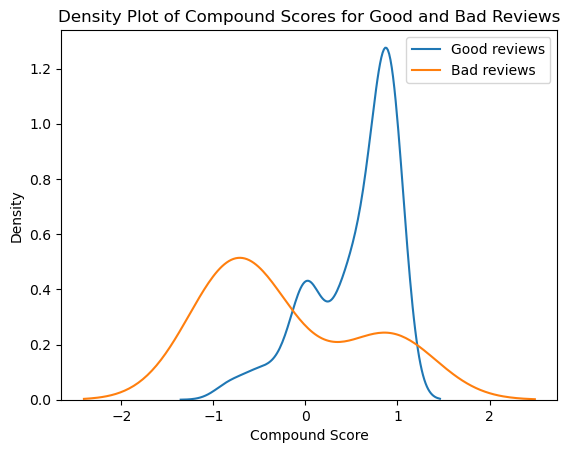

In [23]:
import seaborn as sns
import matplotlib.pyplot as plt

for x in [0, 1]:
    subset = reviews_df[reviews_df['is_bad_review'] == x]
    
    # Draw the density plot
    label = "Good reviews" if x == 0 else "Bad reviews"
    sns.distplot(subset['compound'], hist=False, label=label)

# Add labels and title
plt.xlabel("Compound Score")
plt.ylabel("Density")
plt.title("Density Plot of Compound Scores for Good and Bad Reviews")
plt.legend()
plt.show()


### **Modelling reviewer_score**

In [24]:
#feature selection
label = "is_bad_review"
ignore_cols = [label, "review_english", "review_clean"]
features = [c for c in reviews_df.columns if c not in ignore_cols]

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 26, Finished, Available, Finished)

In [25]:
# split the data into train and test
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(reviews_df[features], reviews_df[label], test_size = 0.20, random_state = 42)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 27, Finished, Available, Finished)

We first choose which features we want to use to train our model. Then we split our data into two parts:

- one to train our model
- one to assess its performances
We will next use a Random Forest (RF) classifier for our predictions.

In [26]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# Select only numeric features and one-hot encode categorical features
X_train = X_train.select_dtypes(include=[np.number])

# Train a random forest classifier
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Get feature names after encoding
feature_names = X_train.columns

# Show feature importance
feature_importances_df = pd.DataFrame({
    "feature": feature_names,
    "importance": rf.feature_importances_
}).sort_values("importance", ascending=False)

# Display the top 20 most important features
print(feature_importances_df.head(20))


StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 28, Finished, Available, Finished)

                                feature  importance
7                        Reviewer_Score    0.129536
13                             compound    0.030564
1373                           word_try    0.023078
15                             nb_words    0.021824
978                           word_plan    0.019430
750                            word_leg    0.019079
10                                  neg    0.019049
1240                      word_standard    0.018039
1241                          word_star    0.016235
1099                       word_respect    0.015780
500                      word_expensive    0.014092
120                        word_average    0.013031
1246                          word_stay    0.013007
3     Review_Total_Negative_Word_Counts    0.012560
589                            word_gel    0.012552
1164                         word_sheet    0.012432
14                             nb_chars    0.011921
189                         word_bright    0.011686
486         

The most important features are indeed the ones that come from the previous sentiment analysis. The vector representations of the texts also have a lot of importance in our training. Some words appear to have a fairly good importance as well.

Considering only Numeric columns for training the mode.

In [27]:
# List of features used in training
features = X_train.columns

# Filter X_test to include only the columns used during training
X_test = X_test[features]

# Then proceed with prediction
y_pred = [x[1] for x in rf.predict_proba(X_test)]


StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 29, Finished, Available, Finished)

StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 30, Finished, Available, Finished)

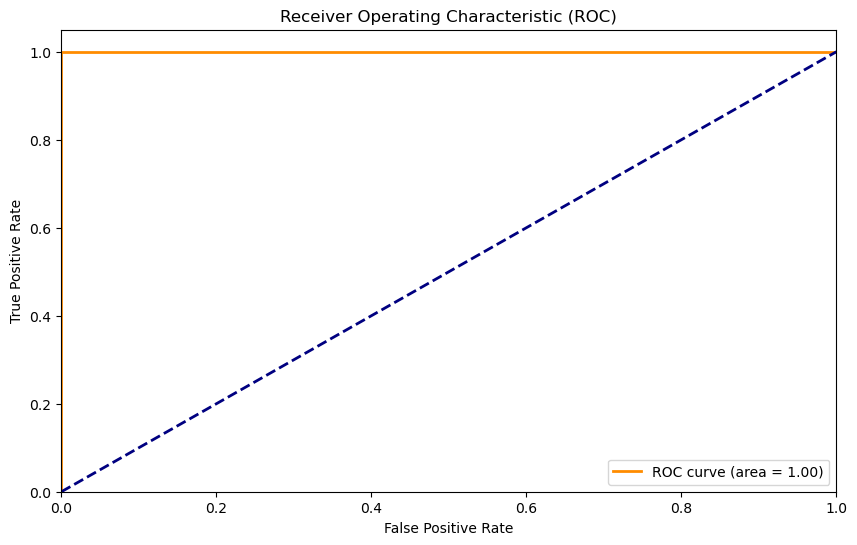

In [28]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Predict probabilities for the positive class
y_pred = [x[1] for x in rf.predict_proba(X_test)]

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label=1)
roc_auc = auc(fpr, tpr)

# Plotting the ROC curve
plt.figure(figsize=(10, 6))
lw = 2
plt.plot(fpr, tpr, color='darkorange', lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()


StatementMeta(, 16702643-1b1f-4fe8-8708-460eb06d2fbf, 31, Finished, Available, Finished)

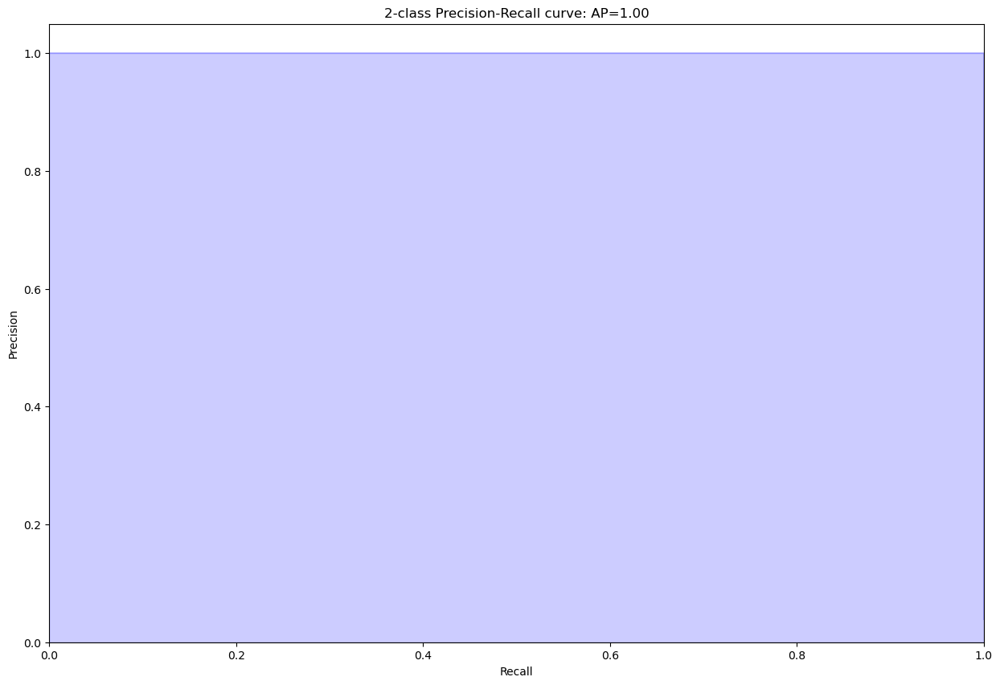

In [29]:
from sklearn.metrics import average_precision_score, precision_recall_curve
import matplotlib.pyplot as plt

# Make sure y_pred contains the predicted probabilities for the positive class
y_pred = rf.predict_proba(X_test)[:, 1]  # Only keep probabilities for the positive class

# Calculate average precision score
average_precision = average_precision_score(y_test, y_pred)

# Calculate precision and recall
precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.figure(1, figsize=(15, 10))
plt.step(recall, precision, color='b', alpha=0.2, where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-class Precision-Recall curve: AP={0:0.2f}'.format(average_precision))
plt.show()
